# <center  style="color:red"> TP3 : Vision par Ordinateur </center>
<center>Chahir Youssef</center>

**Objectif du TP :** Appariement (Couplage) à partir de points d'intérêt pour comprendre les nuances de différentes méthodes de détection de points clés et de métriques d'appariement.


Le bit est d'expérimenter, critiquer et mettre en œuvre différentes techniques de représentation pour l’appariement de structures locales dans les images, en suivant les différentes  étapes de la problématique :

     - Détecteur : Comment réduire le support de la représentation.
     - Descripteur : Quelle information attacher à chaque point du support.
     - Métrique : Quelle mesure utiliser pour apparier des points.
     - Recherche : Comment coder et parcourir l’espace des points d’un modèle.




## I. Points d'intérêt :

Nous avons vu comment les filtres peuvent être utilisés pour trouver des contours dans une image. Cependant, nous pouvons également utiliser des filtres pour détecter des caractéristiques dans une image. Dans le contexte de l'odométrie visuelle, l'objectif est de trouver et d'extraire des caractéristiques d'une image que nous pouvons utiliser comme modèles dans une autre image. De cette manière, nous pouvons faire correspondre les caractéristiques entre deux images et calculer le mouvement relatif entre elles.

La correspondance des points clés peut également être utilisée pour d'autres applications telles que la composition de Panoramas, la reconnaissance d'objets, la reconstruction 3D ou la reconnaissance de lieu.

Le problème est toujours le même : étant donné une image, nous voulons faire correspondre une autre image de la même scène mais prise dans des conditions environnementales différentes.



In [ ]:
%matplotlib inline
import skimage
import cv2
from random import randrange

import matplotlib.image as mpimg
import matplotlib.pylab as plt
import numpy as np



### 1. Point de Harris

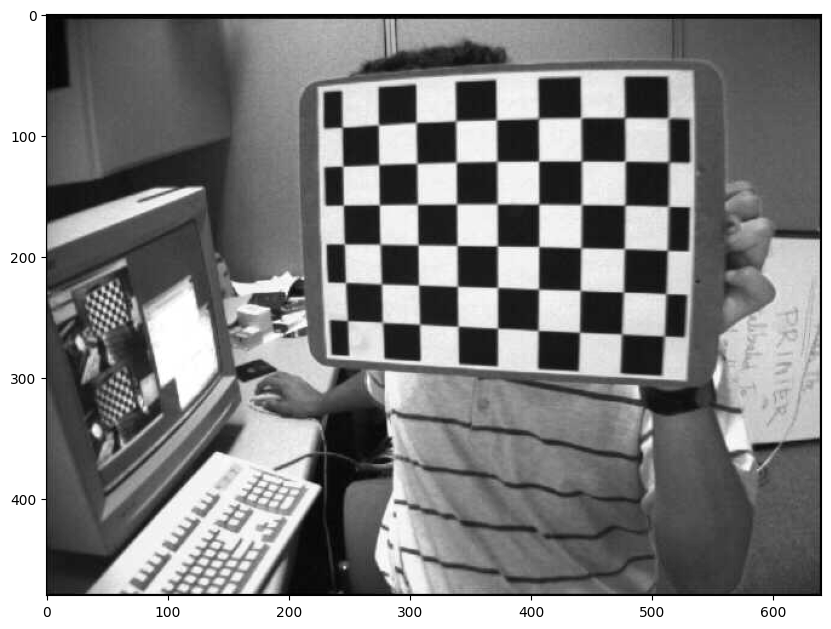

In [ ]:
imgBGR = cv2.imread("images/chess.jpg")
# A compléter .... : Afficher l'image en nveau de gris et normaliser entre 0 et 1




imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)
img = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2GRAY).astype(float)/255

plt.figure(figsize=(10, 10))
plt.imshow(img,"gray")
plt.show()


#### Utilisation de l'implementation cv2 de Harris

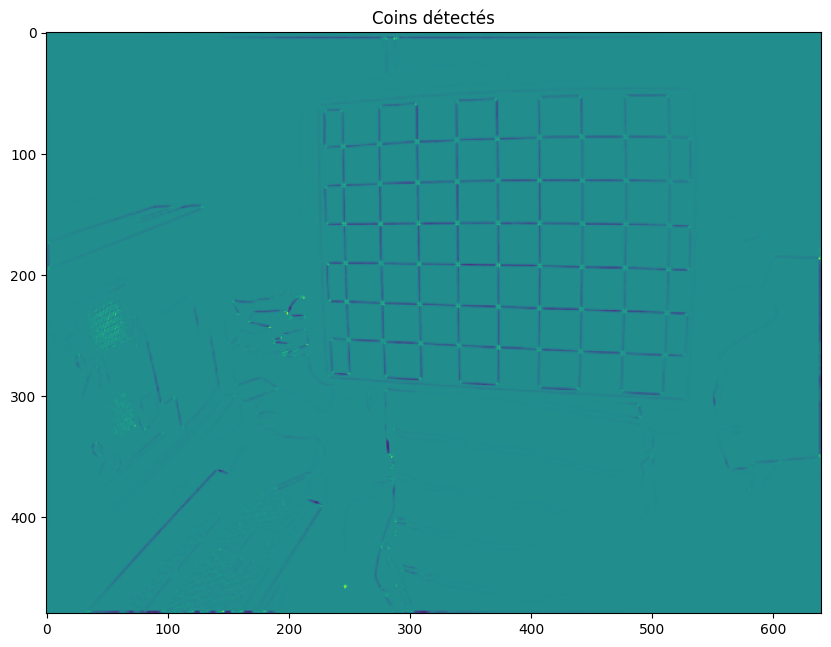

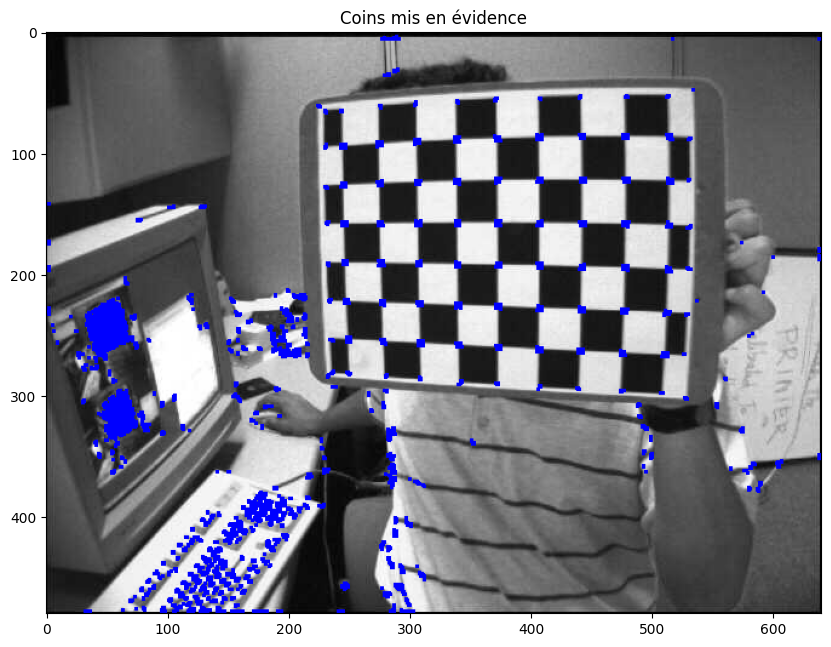

In [ ]:
# A compléter .... :
# Convertir l'image en niveaux de gris en float 32
# Utiliser cv2.cornerHarris
# ...
# ...

img32=img.astype(np.float32)
harris = cv2.cornerHarris(img32, blockSize=2, ksize=3, k=0.04)

# Afficher l'image des coins détectés
plt.figure(figsize=(10, 10))
plt.imshow(harris)
plt.title("Coins détectés")
plt.show()

# Dilater le résultat pour marquer les coins (+ important)
harris = cv2.dilate(harris, None)

# Seuillage pour obtenir une valeur optimale (elle peut varier en fonction de l'image)

# Choisir un seuil 1% du max de harris et mettre en évidence (en bleu) les points de harris
# ...

seuil = 0.01 * harris.max()
# Mettre en évidence (en bleu) les points de harris
imgRGB = cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB)
imgRGB[harris > seuil] = [0, 0, 255]



# Afficher l'image avec les coins mis en évidence
plt.figure(figsize=(10, 10))
plt.imshow(imgRGB)
plt.title("Coins mis en évidence")
plt.show()

#### Utilisation de votre implementation de Harris :

Ecrire un code qui effectue une analyse des coins dans une image en calculant les dérivées dans les directions x et y, puis en effectuant une analyse des valeurs propres pour chaque fenêtre de l'image.

Les résultats sont stockés dans les matrices l_max, l_min, det et trace.

In [ ]:
# Charger l'image en niveaux de gris
img = cv2.imread('images/chess.jpg', 0).astype(np.float32)

# Dérivées dans les directions x et y
noyau_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
Ix = cv2.filter2D(img, -1, noyau_x)

noyau_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
Iy = cv2.filter2D(img, -1, noyau_y)

# Utiliser un patch 3x3 et calculer le déterminant et la trace de la matrice d'autocorrélation
taille_fenetre = 3

l_max = np.zeros(img.shape)
l_min = np.zeros(img.shape)
det = np.zeros(img.shape)
trace = np.zeros(img.shape)

for y in range(taille_fenetre, img.shape[0] - taille_fenetre):
    for x in range(taille_fenetre, img.shape[1] - taille_fenetre):

        # Extraire la fenêtre
        fenetre_Ix = Ix[y - 1:y + taille_fenetre - 1, x - 1:x + taille_fenetre - 1]
        fenetre_Iy = Iy[y - 1:y + taille_fenetre - 1, x - 1:x + taille_fenetre - 1]

        # Calculer la matrice d'autocorrélation
        M = np.array([[np.sum(fenetre_Ix**2), np.sum(fenetre_Ix * fenetre_Iy)],
                      [np.sum(fenetre_Ix * fenetre_Iy), np.sum(fenetre_Iy**2)]])

        # Calculer les valeurs propres
        valeurs_propres, _ = np.linalg.eig(M)

        # Stocker les résultats
        l_max[y, x] = np.max(valeurs_propres)
        l_min[y, x] = np.min(valeurs_propres)
        det[y, x] = np.linalg.det(M)
        trace[y, x] = np.trace(M)

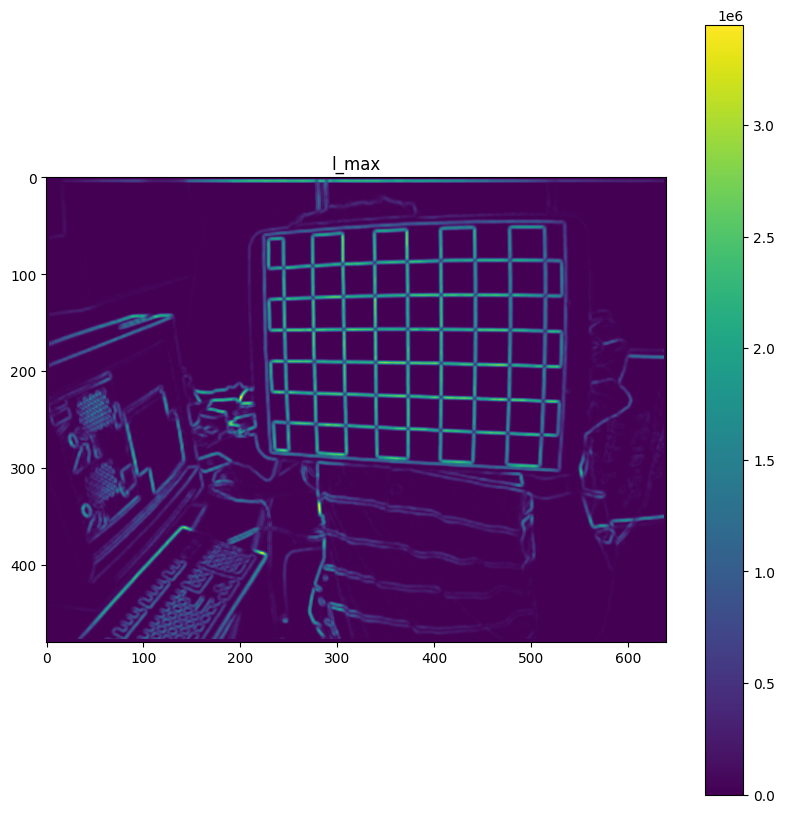

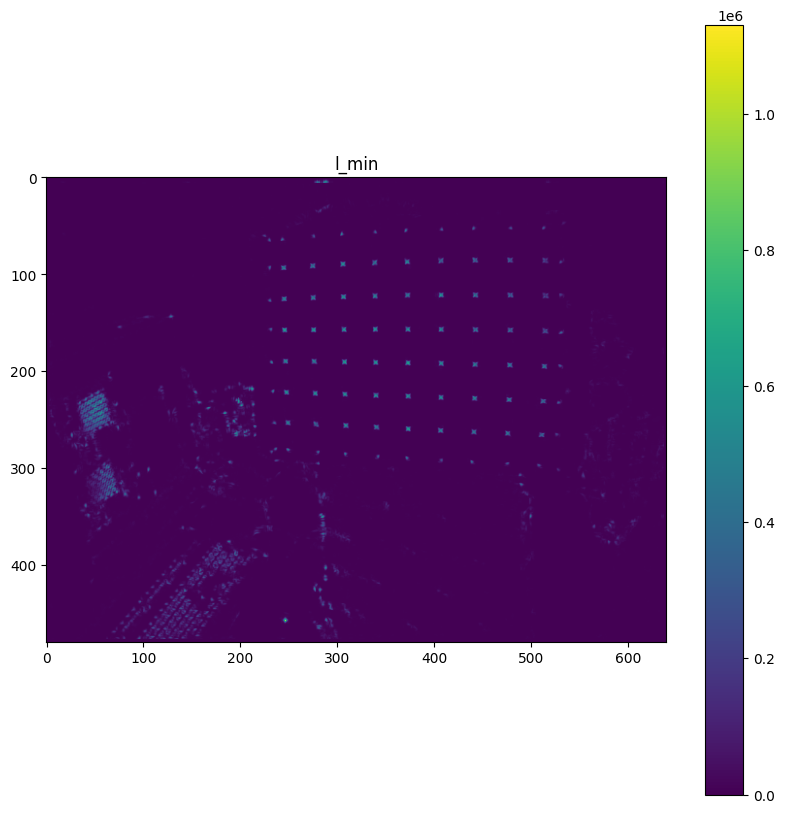

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(l_max)
plt.colorbar()
plt.title("l_max")
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(l_min)
plt.colorbar()
plt.title("l_min")
plt.show()



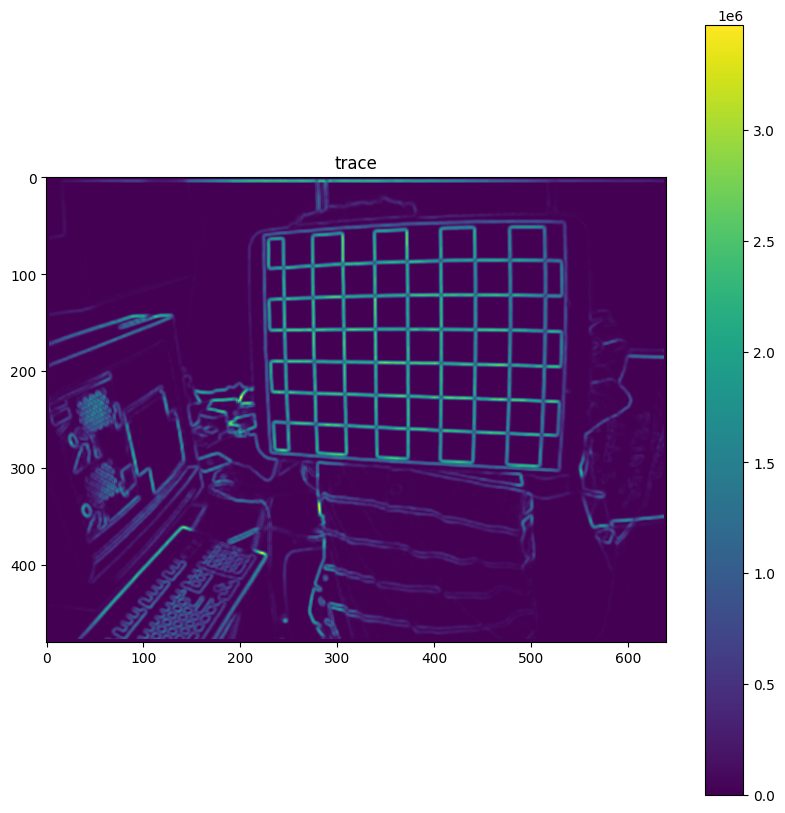

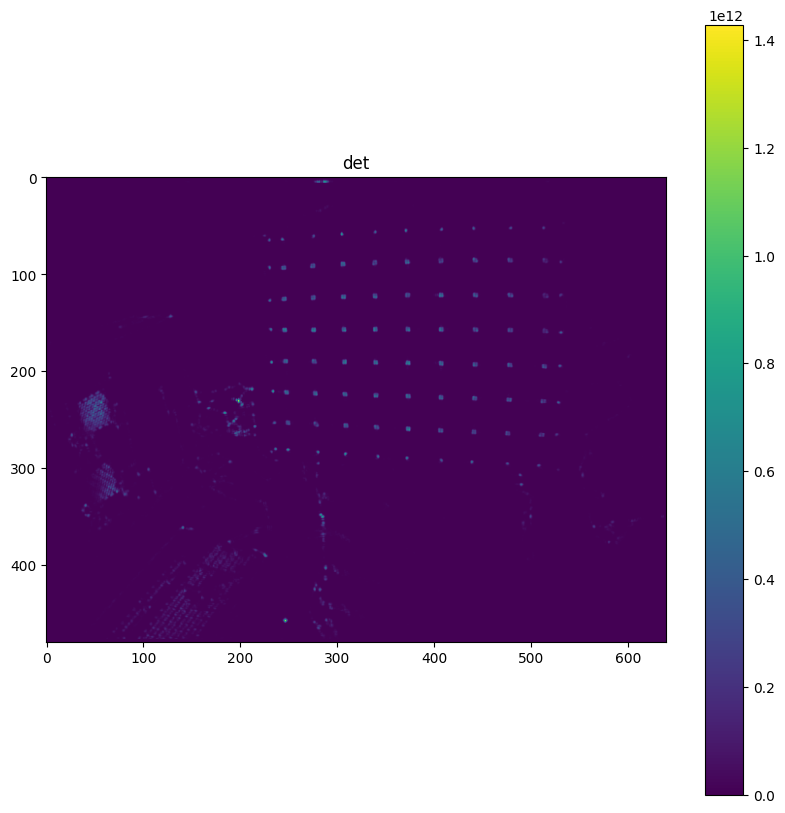

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(trace)
plt.colorbar()
plt.title("trace")
plt.show()

plt.figure(figsize=(10, 10))
plt.imshow(det)
plt.colorbar()
plt.title("det")
plt.show()




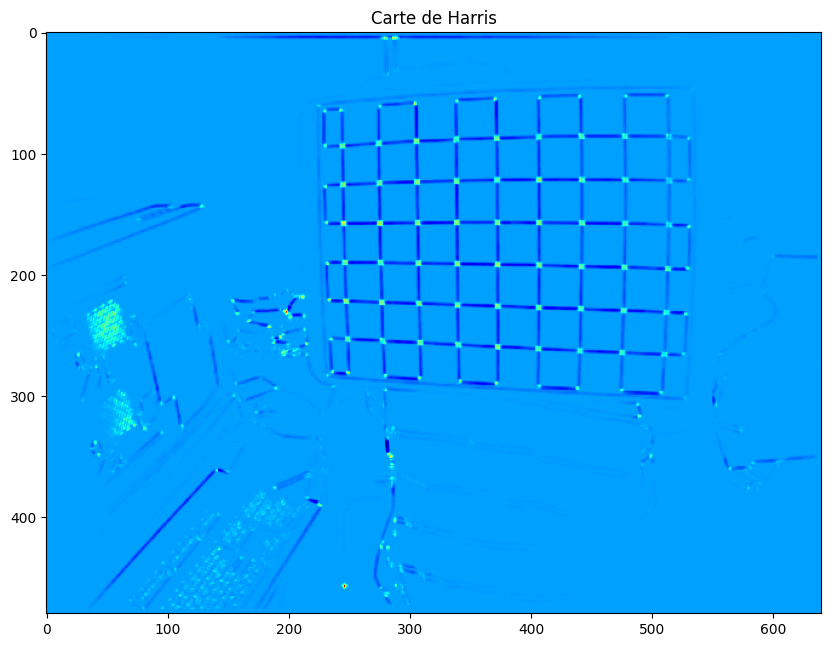

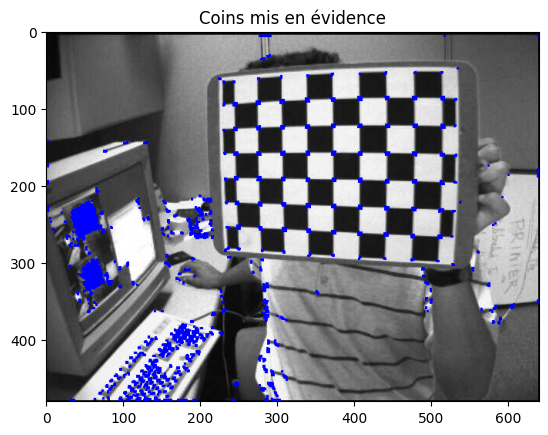

In [ ]:
# A compléter
# Regarder le cours pour détecter les coins de Harris en fonction du déterminant et de la trace
# ...
# ...

alpha = 0.04  # Paramètre pour ajuster la sensibilité
harris = (l_max * l_min - alpha * (l_max + l_min)**2)

# Seuillage pour obtenir une valeur optimale (elle peut varier en fonction de l'image)
seuil_harris = 0.01 * harris.max()

# Mettre en évidence (en bleu) les points de Harris
imgRGB_harris = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
imgRGB_harris[harris > seuil_harris] = [0, 0, 255]

# Afficher la carte de Harris
plt.figure(figsize=(10, 10))
plt.imshow(harris, cmap='jet')  # Utilisation de la carte de couleur 'jet'
plt.title("Carte de Harris")
plt.show()

# Seuil pour une valeur optimale, cela peut varier en fonction de l'image.
# ...
# à compléter
# ...

plt.imshow(imgRGB)
plt.title("Coins mis en évidence")
plt.show()


Il existe plusieurs méthodes de détection de points clés (ou points d'intérêt) dans le domaine de la vision par ordinateur. Ces méthodes varient en termes de robustesse, de rapidité, d'invariance aux transformations, etc.

La démarche est la suivante :

    - a) Convertir l'image en niveaux de gris

    - b) Initialiser le détecteur et le descripteur en fonction du type spécifié
        
        detecteur   = initialiser_detecteur(type_detecteur)     ==> par exemple  detecteur  =  cv2.ORB_create()  
        descripteur = initialiser_descripteur(type_descripteur) ==> par exemple  descripteur =  cv2.ORB_create()  
    
    - c)  Détection des points clés
    
        points_cles = detecteur.detect(image_grise, None)

    - d)  Calcul des descripteurs
        
        _, descripteurs = descripteur.compute(image_grise, points_cles)
    
    
    - Remarque : On peut utiliser le détecteur pour détecter les points clés et calculer les descripteurs
        
        __, descripteur = detecteur.detectAndCompute(Imge_grise, None)




## 2. Points d'intérêt : Extracteur et Descripteur


OpenCV offre une multitude de points d'intérêts et de descripteurs.

On peut par exemple utiliser les points d'intérêts fournis par goodFeaturesToTrack ou les points orb. Creez un répertoire images que vous peuplerez de plusieurs images. Puis essayer d'afficher les points détecté par ORB et par le détecteur goodFeaturesToTrack. Dans les deux cas on limitera le nombre de points à 50.

In [ ]:
#plt.rcParams['figure.figsize'] = (10, 5)
def plot(image1,image2,titre):
    # Afficher les images avec les coins Harris détectés
    plt.subplot(1, 2, 1), plt.imshow(image1, cmap='gray')
    plt.title(titre+"-Image1"), plt.xticks([]), plt.yticks([])
    plt.subplot(1, 2, 2), plt.imshow(image2, cmap='gray')
    plt.title(titre+"-Image2"), plt.xticks([]), plt.yticks([])
    plt.show()

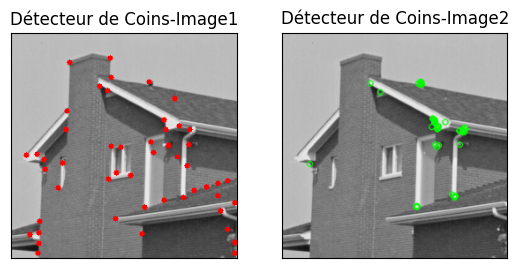

In [ ]:


# Charger l'image
image = cv2.imread('images/house1.ppm', cv2.IMREAD_GRAYSCALE)

# Utiliser goodFeaturesToTrack pour détecter les coins
corners_good = cv2.goodFeaturesToTrack(image, maxCorners=50, qualityLevel=0.01, minDistance=10)
corners_good = np.int0(corners_good)

# Utiliser ORB pour détecter les coins
orb = cv2.ORB_create()
keypoints_orb = orb.detect(image, None)
keypoints_orb = sorted(keypoints_orb, key=lambda x: -x.response)[:50]

# Dessiner les points détectés sur l'image
image_good = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
image_orb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

for corner in corners_good:
    x, y = corner.ravel()
    cv2.circle(image_good, (x, y), 3, 255, -1)

cv2.drawKeypoints(image, keypoints_orb, image_orb, color=(0, 255, 0), flags=0)

# Afficher les images avec les points détectés
plot(image_good, image_orb, "Détecteur de Coins")


### <span style="color:crimson">**[<u>Exercice</u>]**:</span>
***
<div style="color:blue">
        

-  Réaliser un programme interactif qui permet de :
    - Choisir le typed de détecteur
    - Selectionner les paramètres du déteceur

    
</div>

In [ ]:
def extraire_descripteurs(image_grise, type_detecteur='SIFT'):
    if type_detecteur == 'SIFT':
        sift = cv2.xfeatures2d.SIFT_create()
        points_cles, descripteurs = sift.detectAndCompute(image_grise, None)
    elif type_detecteur == 'ORB':
        orb = cv2.ORB_create()
        points_cles, descripteurs = orb.detectAndCompute(image_grise, None)
    elif type_detecteur == 'BRISK':
        brisk = cv2.BRISK_create()
        points_cles, descripteurs = brisk.detectAndCompute(image_grise, None)
    elif type_detecteur == 'AKAZE':
        akaze = cv2.AKAZE_create()
        points_cles, descripteurs = akaze.detectAndCompute(image_grise, None)
    elif type_detecteur == 'KAZE':
        kaze = cv2.KAZE_create()
        points_cles, descripteurs = kaze.detectAndCompute(image_grise, None)
    elif type_detecteur == 'SHI_TOMASI':
        points_cles = cv2.goodFeaturesToTrack(image_grise, 100, 0.01, 10)
        points_cles = np.int0(points_cles)
        descripteurs = None
    elif type_detecteur == 'HARRIS':
        imgFloat32 = np.float32(image_grise)
        points_cles = cv2.cornerHarris(imgFloat32, 2, 3, 0.04)
        points_cles = cv2.dilate(points_cles, None)
        seuil = 0.01 * points_cles.max()
        image_couleur = cv2.cvtColor(imgFloat32, cv2.COLOR_GRAY2BGR)
        image_couleur[points_cles > seuil] = [0, 0, 255]
        descripteurs = None
    elif type_detecteur == 'FAST':
        fast = cv2.FastFeatureDetector_create()
        points_cles = fast.detect(image_grise, None)
        descripteurs = None
    elif type_detecteur == 'GFTT':
        gftt = cv2.GFTTDetector_create()
        points_cles = gftt.detect(image_grise, None)
        descripteurs = None
    else:
        raise ValueError("Type de détecteur non reconnu. Les options valides sont 'SIFT', 'SURF' et 'ORB'.")
    return points_cles, descripteurs


In [ ]:
import ipywidgets as widgets
from ipywidgets import interact, interactive_output

def Test_Points_Interet(image_grise, type_detecteur='SIFT'):
    points_cles, _ = extraire_descripteurs(image_grise, type_detecteur)

    # Affichage de l'image avec les points clés
    image_avec_points = cv2.drawKeypoints(image_grise, points_cles, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(image_avec_points)
    plt.show()


    # Nombre de points
    print("Nombre de points clés détectés : ", len(points_cles))

# Charger une image
image = cv2.imread('images/house2.ppm')
# Convertir l'image en niveaux de gris
image_grise = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Définir le widget interactif
type_widget = widgets.Dropdown(
    options=["HARRIS", "SHI_TOMASI", "FAST", "ORB", "KAZE", "AKAZE", "BRISK", "BRIEF", "SIFT", "GFTT"],
    value="SIFT",
    description="Type"
)

# Utiliser interactive_output pour lier les widgets à la fonction d'affichage
output = interactive_output(Test_Points_Interet, {'image_grise': widgets.fixed(image), 'type_detecteur': type_widget})

# Afficher le widget interactif et la sortie interactive
display(type_widget, output)



Dropdown(description='Type', index=8, options=('HARRIS', 'SHI_TOMASI', 'FAST', 'ORB', 'KAZE', 'AKAZE', 'BRISK'…

Output()

## Remarques
Pour l'appariement (matching) des points d'intérêt, l'idée est de garder pour chaque point1 de la 1ère liste, le point2 de la la liste 2 qui a la plus petite distance. On peut prendre en compte la distance spatiale, mais aussi la simialrité entre deux points.

En cv2, il ya aussi les commandes suivantes:

- bf = cv2.BFMatcher() et bf.knnMatch(desc_l, desc_r, k=2): ici k plus proches voisins (k=2)
- cv2.drawMatchesKnn qui permet de dessiner les meilleurs couplages





In [ ]:
def matching(desc_list1, desc_list2):
    # Determine the correct norm type based on descriptor type
    if desc_list1.dtype.type is np.uint8:
        norm_type = cv2.NORM_HAMMING
    else:
        norm_type = cv2.NORM_L2

    # Create BFMatcher object with the appropriate norm type
    bf = cv2.BFMatcher(norm_type, crossCheck=True)

    # Match descriptors
    matches = bf.match(desc_list1, desc_list2)

    # Sort them in the order of their distance
    matches = sorted(matches, key=lambda x: x.distance)

    return matches

def trace(img1, img2, kp_list1, kp_list2, correspondances):

    height, width = img1.shape[:2]
    img2_resized = cv2.resize(img2, (width, height))


    for kp in kp_list1:
        img1 = cv2.drawMarker(img1, tuple(int(i) for i in kp.pt), color=(0, 0, 255))
    for kp in kp_list2:
        img2_resized = cv2.drawMarker(img2_resized, tuple(int(i) for i in kp.pt), color=(0, 0, 255))


    img_combinee = np.hstack((img1, img2_resized))


    for match in correspondances:
        pt1 = tuple(int(i) for i in kp_list1[match.queryIdx].pt)
        pt2 = tuple(int(i) for i in kp_list2[match.trainIdx].pt)
        pt2 = (pt2[0] + width, pt2[1])
        img_combinee = cv2.line(img_combinee, pt1, pt2, (255, 0, 0), 1)


    plt.imshow(cv2.cvtColor(img_combinee, cv2.COLOR_BGR2RGB))
    plt.title("Appariement de points d'intérêt entre les deux images")
    plt.axis('off')
    #plt.show()


In [ ]:
def detect_harris_keypoints(image):
    # Convertir en niveaux de gris
    imgcp = image.copy()
    gray = cv2.cvtColor(imgcp, cv2.COLOR_BGR2GRAY)

    # Détecter les coins avec l'algorithme de Harris
    gray = np.float32(gray)
    corners = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

    # Dilater les coins pour les rendre plus visibles
    corners = cv2.dilate(corners, None)

    # Seuil pour une valeur optimale, cela peut varier en fonction de l'image
    threshold = 0.01 * corners.max()

    # Créer une liste pour les points clés et dessiner des cercles sur les coins détectés
    keypoints = []
    for y in range(corners.shape[0]):
        for x in range(corners.shape[1]):
            if corners[y, x] > threshold:
                keypoints.append(cv2.KeyPoint(x, y, 1))
                cv2.circle(imgcp, (x, y), 8, (255, 0, 0), 1)  # Dessiner un cercle vert

    return keypoints, imgcp

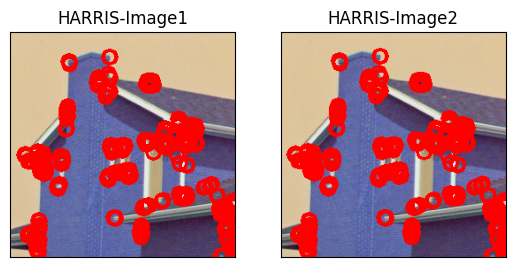

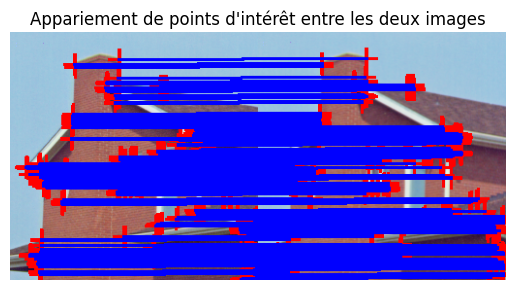

In [ ]:
# Lire les images originales
img1 = cv2.imread('images/house1.ppm')
img2 = cv2.imread('images/house2.ppm')
kp_list1, img_with_keypoints1 = detect_harris_keypoints(img1)
kp_list2, img_with_keypoints2 = detect_harris_keypoints(img2)
plot(img_with_keypoints1,img_with_keypoints2,'HARRIS')

# A compléter ...
# ...
# ...
# ...
def calculate_descriptors(image, keypoints):
    # Utiliser SIFT pour calculer les descripteurs
    sift = cv2.SIFT_create()
    _, descriptors = sift.compute(image, keypoints)
    return descriptors

# Calculer les descripteurs pour les points clés Harris
desc1 = calculate_descriptors(img1, kp_list1)
desc2 = calculate_descriptors(img2, kp_list2)

# Puis exécuter la correspondance
correspondances = matching( desc1, desc2)
trace(img1,img2,kp_list1,kp_list2,correspondances)
# Cette fonction permet de dessiner des croix sur les points des deux images, dessiner les lignes entre les points correspondants sur les deux images
# et afficher le résultat



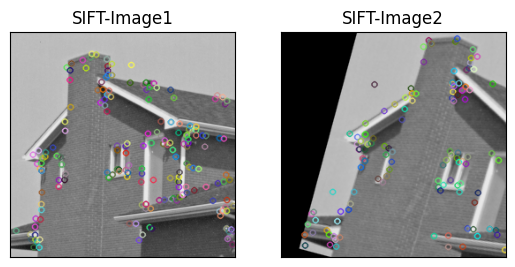

Nombre de points clés détectés pour l'image 1 : 206
Nombre de points clés détectés pour l'image 2 : 126


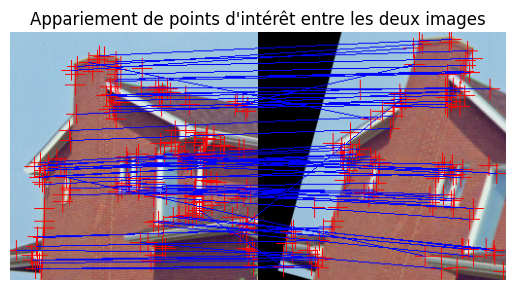

In [ ]:
from skimage.transform import AffineTransform, warp

# Read the original image
image1 = cv2.imread('images/house1.ppm')
image2 = image1.copy()
image1_grise = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)


# Create an AffineTransform instance with scaling, rotation, and translation
transform = AffineTransform(scale=(1.2, 1.2), rotation=np.deg2rad(15), translation=(100, -50))

# Apply the affine transformation using warp from the skimage library
image2 = warp(image1, transform.inverse, output_shape=(image1.shape[0], image1.shape[1]))
# image2_grise = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
# Convert the transformed image back to uint8 type for SIFT
image2 = (255 * image2).astype(np.uint8)
image2_grise = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
detecteur = cv2.SIFT_create()

 # Detect and compute keypoints and descriptors for both images
points_cles_image1, descripteurs_image1 = detecteur.detectAndCompute(image1_grise, None)
points_cles_image2, descripteurs_image2 = detecteur.detectAndCompute(image2_grise, None)

# Convert the grayscale images to RGB for plotting
img_points_cles_image1 = cv2.drawKeypoints(image1_grise, points_cles_image1, None)
img_points_cles_image2 = cv2.drawKeypoints(image2_grise, points_cles_image2, None)

# Plot the images with keypoints
plot(cv2.cvtColor(img_points_cles_image1, cv2.COLOR_BGR2RGB), cv2.cvtColor(img_points_cles_image2, cv2.COLOR_BGR2RGB), 'SIFT')

# Print the number of keypoints for each image
print(f"Nombre de points clés détectés pour l'image 1 : {len(points_cles_image1)}")
print(f"Nombre de points clés détectés pour l'image 2 : {len(points_cles_image2)}")

# Match keypoints using the matching function
correspondances = matching(descripteurs_image1, descripteurs_image2)

# Trace the matches between the two images
trace(image1, image2, points_cles_image1, points_cles_image2, correspondances)

Text(value='images', description='Répertoire')

Dropdown(description='Image 1', options=('tree1.jpg', 'trees2.jpg', 'plan1.jpg', 'house2.ppm', 'left.jpg', 'tr…

Dropdown(description='Image 2', options=('tree1.jpg', 'trees2.jpg', 'plan1.jpg', 'house2.ppm', 'left.jpg', 'tr…

Dropdown(description='Type', index=9, options=('HARRIS', 'SHI_TOMASI', 'FAST', 'ORB', 'MOPS', 'KAZE', 'AKAZE',…

Checkbox(value=True, description='Afficher Points Clés')

Output()

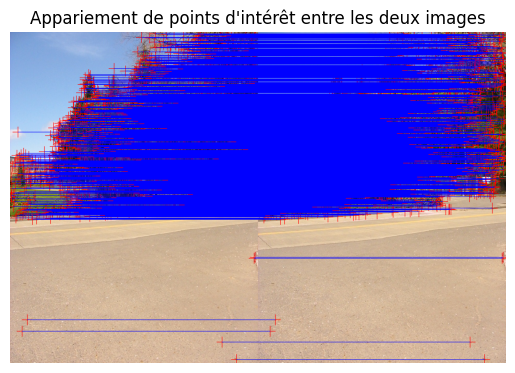

In [ ]:
import cv2
import numpy as np
import ipywidgets as widgets
from ipywidgets import interact, interactive_output
import matplotlib.pyplot as plt
from IPython.display import display
import os


def extraire_descripteurs1(repertoire_images, image1_name, image2_name, type_detecteur='SIFT', apparier_points_cles=True):
    # Charger les images
    image1 = cv2.imread(os.path.join(repertoire_images, image1_name))
    image2 = cv2.imread(os.path.join(repertoire_images, image2_name))

    # Convertir les images en niveaux de gris
    image1_grise = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    image2_grise = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
    if type_detecteur == 'SIFT':
        detecteur = cv2.xfeatures2d.SIFT_create()
    elif type_detecteur == 'SURF':
        detecteur = cv2.xfeatures2d.SURF_create()
    elif type_detecteur == 'ORB':
        detecteur = cv2.ORB_create()
    elif type_detecteur == 'BRISK':
        detecteur = cv2.BRISK_create()
    elif type_detecteur == 'AKAZE':
        detecteur = cv2.AKAZE_create()
    elif type_detecteur == 'KAZE':
        detecteur = cv2.KAZE_create()
    elif type_detecteur == 'FAST':
        detecteur = cv2.FastFeatureDetector_create()
    elif type_detecteur == 'GFTT':
        detecteur = cv2.GFTTDetector_create()
    else:
        raise ValueError("Type de détecteur non reconnu. Les options valides sont 'SIFT', 'SURF' et 'ORB'.")


    # Détection des points clés pour les deux images et calcul des descripteurs
    points_cles_image1, descripteurs_image1 = detecteur.detectAndCompute(image1_grise, None)
    points_cles_image2, descripteurs_image2 = detecteur.detectAndCompute(image2_grise, None)

    # Afficher les images avec les points clés
    img_with_keypoints1 = cv2.drawKeypoints(image1, points_cles_image1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    img_with_keypoints2 = cv2.drawKeypoints(image2, points_cles_image2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Convert images to RGB for matplotlib compatibility
    img_with_keypoints1 = cv2.cvtColor(img_with_keypoints1, cv2.COLOR_BGR2RGB)
    img_with_keypoints2 = cv2.cvtColor(img_with_keypoints2, cv2.COLOR_BGR2RGB)

    # Afficher les images côte à côte
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))
    ax1.imshow(img_with_keypoints1)
    ax1.set_title(f"Keypoints - {image1_name}")
    ax1.axis('off')
    ax2.imshow(img_with_keypoints2)
    ax2.set_title(f"Keypoints - {image2_name}")
    ax2.axis('off')
    plt.show()

    # Si on choisit d'apparier les points clés, on affiche les correspondances
    if apparier_points_cles:
        # Utiliser la fonction de matching définie précédemment
        correspondances = matching(descripteurs_image1, descripteurs_image2)
        # Afficher les correspondances avec la fonction trace définie précédemment
        trace(image1, image2, points_cles_image1, points_cles_image2, correspondances)


# Liste des noms d'images pour les deux listes
repertoire_images = 'images'  # Remplacez cela par le chemin vers votre répertoire
image_names_list1 = os.listdir(repertoire_images)
image_names_list2 = os.listdir(repertoire_images)

# Définir les widgets interactifs
repertoire_widget = widgets.Text(
    value=repertoire_images,
    description="Répertoire"
)

image_widget_list1 = widgets.Dropdown(
    options=image_names_list1,
    value=image_names_list1[0],
    description="Image 1"
)

image_widget_list2 = widgets.Dropdown(
    options=image_names_list2,
    value=image_names_list2[0],
    description="Image 2"
)

type_widget = widgets.Dropdown(
    options=["HARRIS", "SHI_TOMASI", "FAST", "ORB", "MOPS", "KAZE", "AKAZE", "BRISK", "BRIEF", "SIFT", "GFTT"],
    value="SIFT",
    description="Type"
)

checkbox_widget = widgets.Checkbox(
    value=True,
    description="Afficher Points Clés"
)

# Utiliser interactive_output pour lier les widgets à la fonction d'affichage
# Correctly setting up interactive_output
output = interactive_output(extraire_descripteurs1, {
    'repertoire_images': repertoire_widget,
    'image1_name': image_widget_list1,
    'image2_name': image_widget_list2,
    'type_detecteur': type_widget,
    'apparier_points_cles': checkbox_widget
})

# Display widgets
display(repertoire_widget, image_widget_list1, image_widget_list2, type_widget, checkbox_widget, output)

## II. Similarité entre vecteurs caractéristiques : Quelques mesures

- Dans la **corrélation croisée normalisée (NCC)**  nous interprétons les points comme des vecteurs et prenons leur produit croisé divisé par les longueurs des vecteurs. Si les images / vecteurs sont égaux, leur NCC sera de 1. S'ils sont perpendiculaires, le NCC est de 0 - un NCC de -1 suggère que les vecteurs sont exactement opposés l'un à l'autre.

    <img src="https://github.com/joelbarmettlerUZH/PyVisualOdometry/raw/master/img/chapter_6/cross_correlation.png" alt="Normalized Cross Correlation">


- **Somme des différences au carré (SSD)**:

    ![Sum of Squared Differences](https://github.com/joelbarmettlerUZH/PyVisualOdometry/raw/master/img/chapter_6/sum_of_squared_differences.png)


- **Somme des Différences Absoluesé (SAD)**:

    ![Sum of Absolute Differences](https://github.com/joelbarmettlerUZH/PyVisualOdometry/raw/master/img/chapter_6/sum_of_absolute_differences.png)


- **Corrélation Croisée Normalisée à Moyenne Nulle (ZNCC)**:   L

    ![Zero-mean similarities](https://github.com/joelbarmettlerUZH/PyVisualOdometry/raw/master/img/chapter_6/zero_mean_similarities.png)



    ... et bien d'autres :


    from scipy.spatial.distance import euclidean, cityblock, correlation, cosine, braycurtis

    from scipy.spatial.distance import directed_hausdorff

    from scipy.stats import pearsonr

    from sklearn.metrics import jaccard_score

    from fastdtw import fastdtw

    from skimage.measure import shannon_entropy

    from sklearn.metrics import mutual_info_score

    from scipy.stats import wasserstein_distance    #distance de Wasserstein (Earth Mover's Distance - EMD)








# II. Distance entre nuages de points

Calculer les distances  suivantes entre les descripteurs SIFT (ou autres) de deux images :
    - Distance de Hausdorff
    - Distance EMD (Earth Mover's Distance) également connue sous le nom de distance de Wasserstein


In [ ]:
!pip install fastdtw

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fastdtw: filename=fastdtw-0.3.4-cp310-cp310-linux_x86_64.whl size=512582 sha256=e3489e354835783636387861d35134dca4f6cafe39c28767f7740dcc0e14bd40
  Stored in directory: /root/.cache/pip/wheels/73/c8/f7/c25448dab74c3acf4848bc25d513c736bb93910277e1528ef4
Successfully built fastdtw


In [ ]:
import cv2
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
from fastdtw import fastdtw
from sklearn.metrics import mutual_info_score
from scipy.spatial.distance import cdist, euclidean


def extract_sift(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return descriptors

def hausdorff_distance(liste1, liste2):
    """
    Calcule la distance d'Hausdorff  entre  deux ensembles de  points.
    Returns:
        float: Hausdorff distance
    """
    dist1 = cdist(liste1, liste2)
    dist2 = cdist(liste2, liste1)

    hausdorff_dist = max(dist1.min(axis=1).max(), dist2.min(axis=1).max())
    return hausdorff_dist

# chargement des images
image1 = cv2.imread('images/house1.ppm')
image2 = cv2.imread('images/house2.ppm')

# Extraction des points SIFT
sift_points_img1 = extract_sift(image1)
sift_points_img2 = extract_sift(image2)

# Calculate Hausdorff distance
hausdorff_dist = hausdorff_distance(sift_points_img1, sift_points_img2)
print(f"Distance de Hausdorff : {hausdorff_dist}")

# Calculate Earth Mover's Distance (EMD)
def emd_distance(descriptors1, descriptors2):
    distance_matrix = cdist(descriptors1, descriptors2)
    _, assignment = linear_sum_assignment(distance_matrix)
    emd_dist = distance_matrix[assignment].sum() / len(assignment)
    return emd_dist

emd_distance_val = emd_distance(sift_points_img1, sift_points_img2)
print("Earth Mover's Distance:", emd_distance_val)

# Calculate Dynamic Time Warping (DTW) distance
def dtw_distance(descriptors1, descriptors2):
    distance, _ = fastdtw(descriptors1, descriptors2, dist=euclidean)
    return distance

dtw_distance_val = dtw_distance(sift_points_img1, sift_points_img2)
print("Distance d'édition (DTW):", dtw_distance_val)

# Compute mutual information
mi_score = mutual_info_score(sift_points_img1.flatten(), sift_points_img2.flatten())
print("Mutual Information Score:", mi_score)


Distance de Hausdorff : 421.7392559390221
Earth Mover's Distance: 110551.06610652104
Distance d'édition (DTW): 9617.156318518091
Mutual Information Score: 1.4776645872808052


Definissez  une fonction **dist_pts_interet** qui prend deux noms d'images en paramètre, calcule les points d'intérêt puis les descripteurs ORBS associés :

-   Calculez ensuite la matrice de distance entre tous les descripteurs grâce à une fonction **cout_alignement**  qui prend en paramèttre les deux jeux de descripteurs.

-   Utiliser ensuite la bibliothèque scipy pour trouver l'appariement optimal induit par cette matrice de distance :
    -   On veut apparier les points dont les descripteurs sont les plus proches..
    -   La fonction dist_pts_interet renvoie le coût de cet appariement optimal.

In [ ]:
def creer_dictionnaire(nom, orb, orb_detect):
    img = cv2.imread(nom)
    # Dans cette fonction, on va utiliser le détecteur orb directement (qd orb_detect), sinon on utilise  cv2.goodFeaturesToTrac
    # A compléter ...
    kp, desc = orb.detectAndCompute(img, None)
    # ...
    # ...
    return {'nom': nom, 'kp': kp, 'desc': desc, 'img': img}


In [ ]:
def cout_alignement(desc1, desc2):
    # A compléter ...
    # ...
    # ...
    distance = np.linalg.norm(desc1[:, None] - desc2[None, :], axis=2)

    return distance


In [ ]:
def dist_pts_interet(pt_desc1, pt_desc2):
 # Calculer la matrice de coût
    distance = cout_alignement(pt_desc1['desc'], pt_desc2['desc'])

    # Trouver l'assignation optimale
    row_ind, col_ind = linear_sum_assignment(distance)

    # Calculer le coût de l'assignation optimale
    cout = distance[row_ind, col_ind].sum()

    return cout, row_ind, col_ind



In [ ]:
#Créer un détecteur
orb = cv2.ORB_create()

# Exemple d'utilisation :
img1_dict = creer_dictionnaire('images/house1.ppm', orb, True)
img2_dict = creer_dictionnaire('images/house2.ppm', orb, True)

# Exemple d'utilisation de la fonction dist_pts_interet
cout, row_ind, col_ind = dist_pts_interet(img1_dict, img2_dict)

# Afficher les résultats
print("Coût :", cout)
#print("Indices de lignes :", row_ind)
#print("Indices de colonnes :", col_ind)
print ("Taille lignes : ", len(row_ind))
print ("Taille colonnes : ", len(col_ind))

Coût : 140297.96912730148
Taille lignes :  377
Taille colonnes :  377


In [ ]:
def charger_noms(fichier):
    noms = []
    with open(fichier, "r") as f:
        noms = f.readlines()
    noms = [nom[:-1] for nom in noms]
    return noms


Définissez dans le répertoire images un fichier list.txt contenant une liste d'images. Ce fichier est chargé par charger_noms.

-   Calculer la distance entre toutes les paires d'images induite par le distance entre les points clés 'dist_pts_interet'.
-   Utiliser la fonction afficher pour afficher les images (comme lors du tp précédant).  
-   Faire deux affichages avec les points détectés par ORB et avec les points détectés par goodFeaturesToTrack.

In [ ]:
# Créer un détecteur ORB avec des paramètres spécifiques
orb = cv2.ORB_create(edgeThreshold=0, nfeatures=50)

# Charger les noms de fichiers depuis une liste
fichiers = charger_noms('list.txt')
# Créer une liste de PtDesc
PtDesc = [creer_dictionnaire(nom, orb, False) for nom in fichiers]

# Calculer les distances
# .....
# .....
distances = np.zeros((len(PtDesc), len(PtDesc)))
# Calculer les distances
for i in range(len(PtDesc)):
    for j in range(i+1, len(PtDesc)):
        cout, _, _ = dist_pts_interet(PtDesc[i], PtDesc[j])
        distances[i, j] = cout
        distances[j, i] = cout  # La distance est symétrique
print(distances)

[[    0.         21421.96881728  2686.64571298  5414.27476187
  34510.67697637 34629.54988628 35132.50961628 34510.67697637]
 [21421.96881728     0.          2673.12423859  5446.82408254
  34414.47453832 34668.58222072 35170.13491909 34414.47453832]
 [ 2686.64571298  2673.12423859     0.          2766.05434507
   2794.29071912  2746.36415045  2634.77644643  2794.29071912]
 [ 5414.27476187  5446.82408254  2766.05434507     0.
   5604.5147764   5499.40511308  5311.20682298  5604.5147764 ]
 [34510.67697637 34414.47453832  2794.29071912  5604.5147764
      0.         34196.17217634 34672.82862644     0.        ]
 [34629.54988628 34668.58222072  2746.36415045  5499.40511308
  34196.17217634     0.         34846.90945124 34098.23405852]
 [35132.50961628 35170.13491909  2634.77644643  5311.20682298
  34672.82862644 34846.90945124     0.         34618.96557056]
 [34510.67697637 34414.47453832  2794.29071912  5604.5147764
      0.         34098.23405852 34618.96557056     0.        ]]


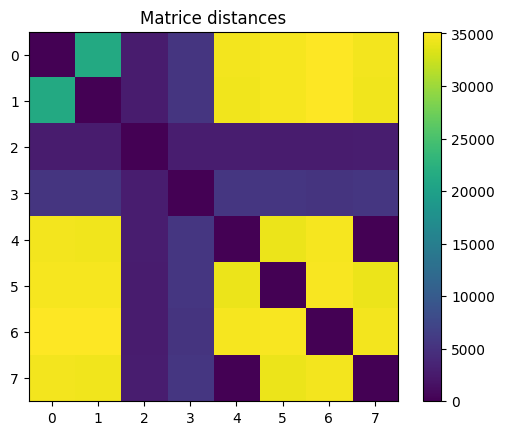

In [ ]:
import plotly.graph_objects as go

#distances_matrice = [[dist[0] for dist in row] for row in distances]

# Affichage de la matrice de poids sous forme d'image
plt.imshow(distances, cmap='viridis', interpolation='nearest')
plt.title('Matrice distances')
plt.colorbar()
plt.show()

# A compléter
# Afficher la matrice distance avec plotly
# .....
# .....
fig = go.Figure(data=go.Heatmap(
                   z=distances,
                   x=[item['nom'] for item in PtDesc],  # Labels pour l'axe X
                   y=[item['nom'] for item in PtDesc],  # Labels pour l'axe Y
                   colorscale='Viridis'))

# Mise à jour des titres et mises en page
fig.update_layout(
    title='Matrice des distances',
    xaxis_title="Images",
    yaxis_title="Images")

# Afficher le graphique
fig.show()


In [ ]:
from sklearn.manifold import MDS
from scipy.spatial.distance import squareform

def afficher(distance, noms):
    # Vérifier que la matrice est carrée
    if len(distance) != len(distance[0]):
        raise ValueError("La matrice de distances doit être carrée.")

    # Appliquer MDS
    mds = MDS(n_components=2, dissimilarity='precomputed', random_state=1)
    Pts = mds.fit_transform(distance)

    # Affichage des points
    plt.title("Embedding")
    plt.scatter(Pts[:, 0], Pts[:, 1])
    for i, nom in enumerate(noms):
        plt.text(Pts[i, 0], Pts[i, 1], nom)

    plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



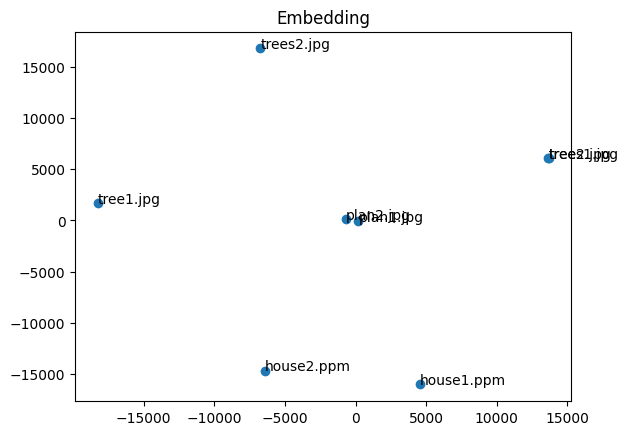

In [ ]:


# Extract base names from paths
names = [os.path.basename(file) for file in fichiers]
# Display the results
afficher(distances, names)

In [ ]:
# Appelez la fonction avec votre liste de listes de distances et les noms
# afficher_3d(distances, names)


def afficher_3d(distance, names):

    # Assurer que la matrice de distance est carrée
    if len(distance) != len(distance[0]):
        raise ValueError("La matrice de distances doit être carrée.")

    # Décomposition en valeurs singulières (SVD)
    U, S, Vt = np.linalg.svd(distance)

    # Prendre les 3 premiers vecteurs singuliers
    x, y, z = U[:, 0], U[:, 1], U[:, 2]

    # Créer le graphique en 3D avec Plotly
    trace = go.Scatter3d(x=x, y=y, z=z, mode='markers+text', text=names,
                         marker=dict(size=5, color='blue'))
    layout = go.Layout(title="3D Embedding avec SVD",
                       scene=dict(xaxis_title='Composant 1',
                                  yaxis_title='Composant 2',
                                  zaxis_title='Composant 3'))
    fig = go.Figure(data=[trace], layout=layout)

    # Afficher le graphique
    fig.show()

afficher_3d(distances, names)

##  A Faire :
    - Utiliser une approche interactive pour le choix  des paramètres
    - Tester plusieurs métriques pour appariement (images) : Hausdorff, EMD, Info mutuelle, ...
    - Utiliser différents descripteurs (images)
    - Ajouter plusieurs images dans la base ('list.txt')
    - Comparaison des résultats :
        - Utiliser plusieurs normalisations du noyau (distances)
        - Afficher graphique 3D de chaque noyau ===> Comparaisons

## Bonus : Vue panoramique :

la composition de panorama, où nous avons deux images prises côte à côte avec un certain chevauchement, et nous voulons combiner ces deux images pour obtenir une composition panoramique. On peutle faire en trois étapes :

    1. Trouver des points d'intérêt dans les deux images.
    2. Pour chaque point caractéristique, trouver la paire correspondante dans l'autre image.
    3. Superposer les images de manière à aligner les paires aussi bien que possible.


![Panorama Stitching](https://github.com/joelbarmettlerUZH/PyVisualOdometry/raw/master/img/chapter_6/panorama_stitching.png)


La partie difficile consiste à détecter les mêmes points de manière indépendante dans les deux images. Nous devons disposer de détecteurs de caractéristiques reproductibles, ce qui signifie que nous devons redétecter les mêmes caractéristiques d'une image dans une autre.
Deuxièmement, nous devons trouver de manière distinctive les caractéristiques correspondantes dans les deux images. Pour ce faire, nous utilisons des descripteurs. Les descripteurs sont une description d'un pixel et des caractéristiques autour de lui qui identifient de manière unique le pixel sans ambiguïté. Le descripteur doit être robuste aux changements géométriques et d'éclairage afin que nous puissions trouver le même descripteur dans une image différente. Ces changements géométriques peuvent être la translation, la rotation, la mise à l'échelle et les changements de perspective.

Un changement d'éclairage est une transformation affine simple de la valeur d'un pixel par un facteur constant B. Il peut facilement être surmonté en divisant une image par sa valeur d'intensité moyenne.

L'invariance à la rotation est plus difficile à réaliser. Par exemple, nous pourrions toujours faire tourner nos caractéristiques détectées de telle sorte que les lignes les plus dominantes soient horizontales. Lorsque nous détectons des caractéristiques, nous avons généralement deux méthodes différentes : la détection de coin et la détection de blob. Un coin est une région de contraste qui change significativement dans deux directions perpendiculaires. Il a une précision de localisation très élevée mais est souvent difficile à distinguer. En revanche, un Blob est une région d'image qui diffère significativement de ses voisins - comme un petit motif dominant. Les blobs sont moins précis en termes de localisation que les coins, mais ils sont plus distincts et donc plus faciles à redétecter.






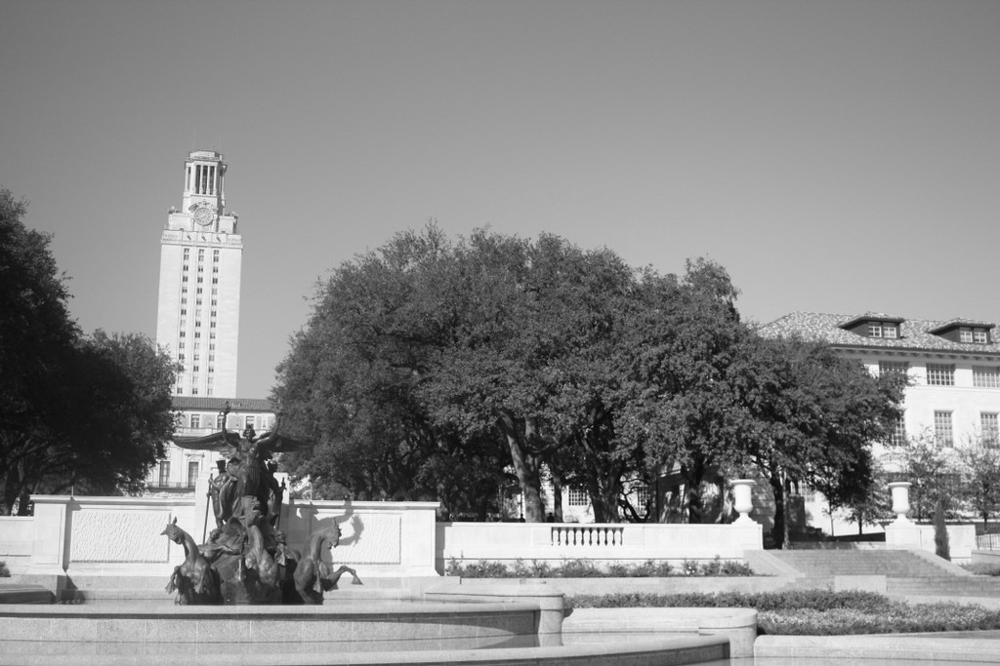

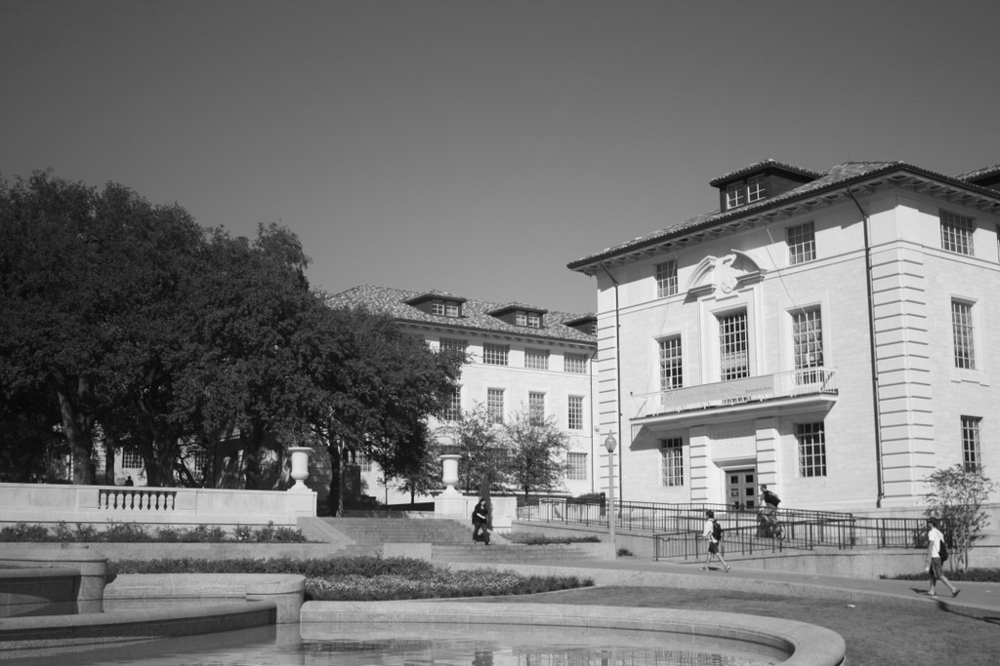

In [ ]:
import sys
import cv2
import numpy as np

from google.colab.patches import cv2_imshow

# Load our images
img1 = cv2.imread("images/left.jpg")
img2 = cv2.imread("images/right.jpg")

img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

cv2_imshow(img1_gray)
cv2_imshow(img2_gray)

# Create our ORB detector and detect keypoints and descriptors
orb = cv2.ORB_create(nfeatures=2000)

# Find the key points and descriptors with ORB
keypoints1, descriptors1 = orb.detectAndCompute(img1, None)
keypoints2, descriptors2 = orb.detectAndCompute(img2, None)

# Create a BFMatcher object.
# It will find all of the matching keypoints on two images
bf = cv2.BFMatcher_create(cv2.NORM_HAMMING)

# Find matching points
matches = bf.knnMatch(descriptors1, descriptors2,k=2)

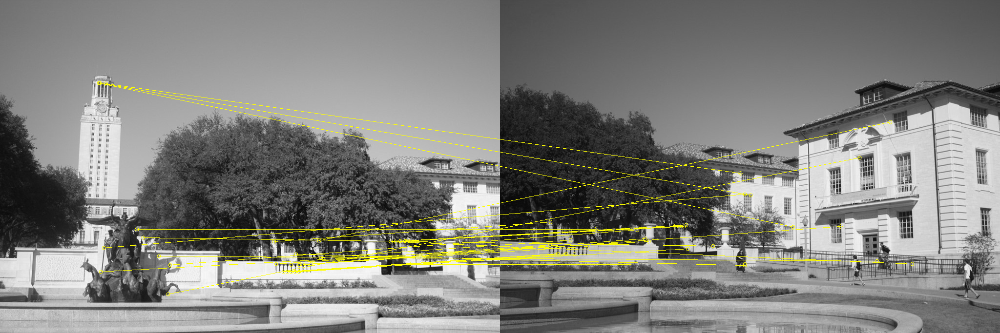

In [ ]:


def draw_matches(img1, keypoints1, img2, keypoints2, matches):
  r, c = img1.shape[:2]
  r1, c1 = img2.shape[:2]

  # Create a blank image with the size of the first image + second image
  output_img = np.zeros((max([r, r1]), c+c1, 3), dtype='uint8')
  output_img[:r, :c, :] = np.dstack([img1, img1, img1])
  output_img[:r1, c:c+c1, :] = np.dstack([img2, img2, img2])

  # Go over all of the matching points and extract them
  for match in matches:
    img1_idx = match.queryIdx
    img2_idx = match.trainIdx
    (x1, y1) = keypoints1[img1_idx].pt
    (x2, y2) = keypoints2[img2_idx].pt

    # Draw circles on the keypoints
    cv2.circle(output_img, (int(x1),int(y1)), 4, (0, 255, 255), 1)
    cv2.circle(output_img, (int(x2)+c,int(y2)), 4, (0, 255, 255), 1)

    # Connect the same keypoints
    cv2.line(output_img, (int(x1),int(y1)), (int(x2)+c,int(y2)), (0, 255, 255), 1)

  return output_img

all_matches = []
for m, n in matches:
  all_matches.append(m)

img3 = draw_matches(img1_gray, keypoints1, img2_gray, keypoints2, all_matches[:30])
cv2_imshow(img3)

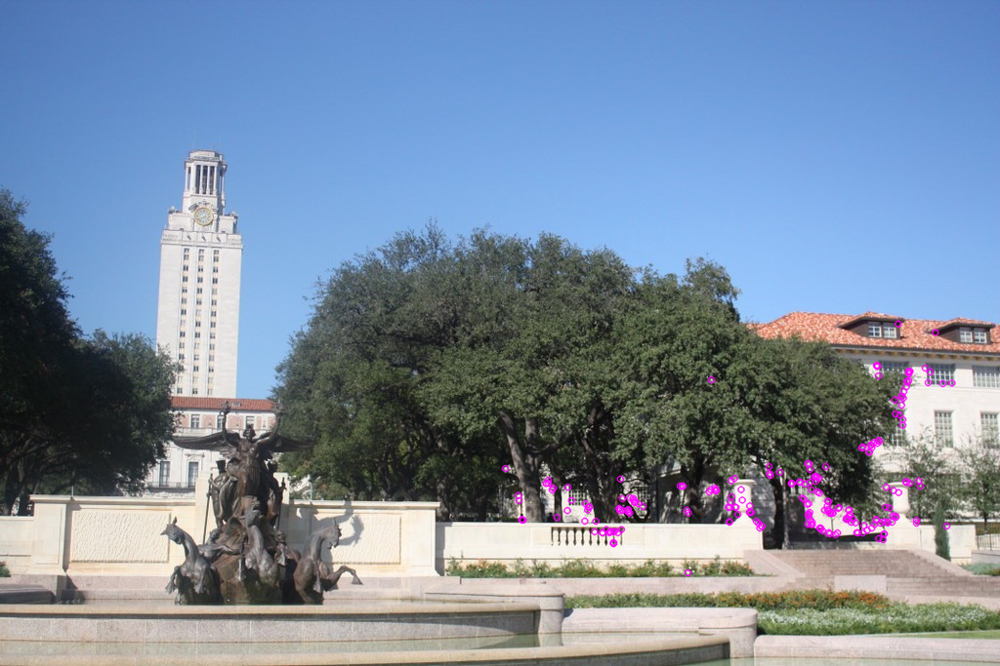

In [ ]:
# Finding the best matches
good = []
for m, n in matches:
    if m.distance < 0.6 * n.distance:
        good.append(m)


cv2_imshow(cv2.drawKeypoints(img1, [keypoints1[m.queryIdx] for m in good], None, (255, 0, 255)))


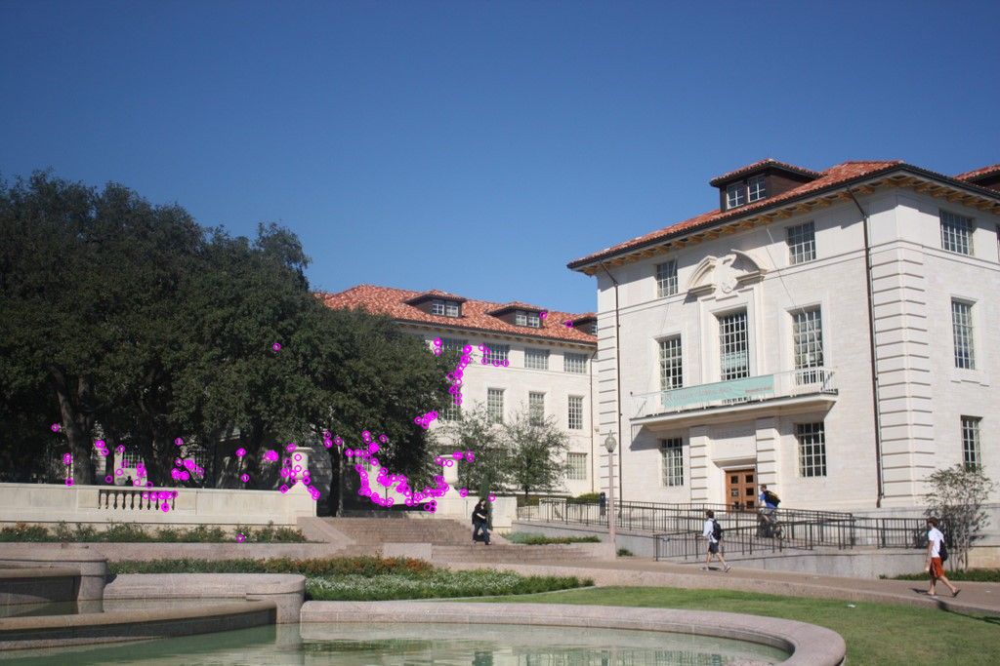

In [ ]:
cv2_imshow(cv2.drawKeypoints(img2, [keypoints2[m.trainIdx] for m in good], None, (255, 0, 255)))


In [ ]:
def warpImages(img1, img2, H):

  rows1, cols1 = img1.shape[:2]
  rows2, cols2 = img2.shape[:2]

  list_of_points_1 = np.float32([[0,0], [0, rows1],[cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
  temp_points = np.float32([[0,0], [0,rows2], [cols2,rows2], [cols2,0]]).reshape(-1,1,2)

  # When we have established a homography we need to warp perspective
  # Change field of view
  list_of_points_2 = cv2.perspectiveTransform(temp_points, H)

  list_of_points = np.concatenate((list_of_points_1,list_of_points_2), axis=0)

  [x_min, y_min] = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
  [x_max, y_max] = np.int32(list_of_points.max(axis=0).ravel() + 0.5)

  translation_dist = [-x_min,-y_min]

  H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

  output_img = cv2.warpPerspective(img2, H_translation.dot(H), (x_max-x_min, y_max-y_min))
  output_img[translation_dist[1]:rows1+translation_dist[1], translation_dist[0]:cols1+translation_dist[0]] = img1

  return output_img

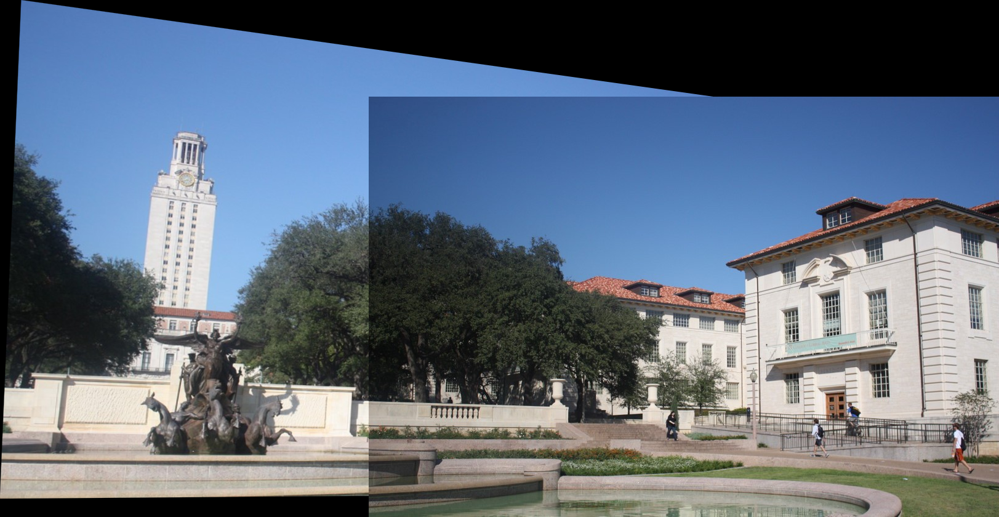

In [ ]:
MIN_MATCH_COUNT = 10

if len(good) > MIN_MATCH_COUNT:
    # Convert keypoints to an argument for findHomography
    src_pts = np.float32([ keypoints1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
    dst_pts = np.float32([ keypoints2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

    # Establish a homography
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)

    result = warpImages(img2, img1, M)

    cv2_imshow(result)

<div style="color:red">

***
# Fin du TP3

***
    
</div>